In [1]:
import pandas as pd 
import numpy as np
import tensorflow as tf
from tensorflow.python.keras.models import load_model
from tensorflow import keras
import os
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
os.environ["CUDA_VISIBLE_DEVICES"] = "1"

In [2]:
def build_dataset(seq_length):
    address1="../Merged_Data/train_x(Seasonal_Trend).csv"
    df1 = pd.read_csv(address1).drop("time",axis=1)
    
    time_series_x = df1.values
    dataX = []
    
    for i in range(0, len(time_series_x)-seq_length):
        _x = time_series_x[i:i+seq_length, :]
        dataX.append(_x)

    return np.array(dataX)

In [3]:
data=build_dataset(25)

In [4]:
data.shape

(55202, 25, 4)

In [5]:
from metats.pipeline import MetaLearning

pipeline = MetaLearning(method='averaging', loss='mse')

In [6]:
from metats.features.unsupervised import DeepAutoEncoder
from metats.features.deep import AutoEncoder, LSTMDecoder, LSTMEncoder

enc = LSTMEncoder(input_size=4, latent_size=4,
                hidden_size=16, num_layers=24, directions=1)
dec = LSTMDecoder(output_length=1, output_size=1,
                latent_size=4, hidden_size=16, num_layers=2, directions=1)

ae = AutoEncoder(encoder=enc, decoder=dec)

ae_features = DeepAutoEncoder(auto_encoder=ae, epochs=70, verbose=False)

pipeline.add_feature(ae_features)

c:\Users\heeji\anaconda3\envs\meta2\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [7]:
forecaster1  = load_model('../Model_Training/Saved_Model/LSTM(Early_Stopping).pt')

forecaster2 = load_model('../Model_Training/Saved_Model/Attention_LSTM(Early_Stopping).pt')

forecaster3 = load_model('../Model_Training/Saved_Model/Dual_Attention_LSTM(Early_Stopping).pt')

pipeline.add_forecaster(forecaster1)
pipeline.add_forecaster(forecaster2)
pipeline.add_forecaster(forecaster3)

In [8]:
from sklearn.linear_model import SGDClassifier

pipeline.add_metalearner(SGDClassifier(loss='log'))

In [9]:
pipeline.fit(data,fh=1)

In [10]:
def build_testset(seq_length):
    address1="../Merged_Data/test_x(Seasonal_Trend).csv"
    df1 = pd.read_csv(address1).drop("time",axis=1)
    address2="../Merged_Data/test_y.csv"
    df2 = pd.read_csv(address2)
    
    time_series_x = df1.values
    time_series_y = df2.values
    dataX = []
    dataY = []
    
    for i in range(0, len(time_series_x)-seq_length):
        _x = time_series_x[i:i+seq_length, :]
        _y = time_series_y[i+seq_length-1]
        
        dataX.append(_x)
        dataY.append(_y)

    return np.array(dataX), np.array(dataY)

In [11]:
test_x,test_y=build_testset(24)

In [12]:
pred=pipeline.predict(test_x,1)

In [13]:
print(test_y)

[[0.12907646]
 [0.14963004]
 [0.13976432]
 ...
 [0.15867361]
 [0.15264456]
 [0.15456289]]


In [14]:
print(test_x[:,-1:,2])

[[0.14447349]
 [0.14424492]
 [0.14374491]
 ...
 [0.14340205]
 [0.14343062]
 [0.14340205]]


In [15]:
import joblib
Y_scaler=joblib.load("../Merged_Data/Scaler/Y_pm10.pkl")

inv_test_y=Y_scaler.inverse_transform(test_y)
inv_pred=Y_scaler.inverse_transform(pred[0])

In [16]:
inv_pred

array([[ 7.15190728],
       [ 8.32397523],
       [ 8.26483939],
       ...,
       [10.33274593],
       [10.07782508],
       [ 9.80806958]])

In [17]:
import matplotlib.pyplot as plt
from matplotlib import font_manager
import numpy as np

def vizualization_self(train_term,test_y,pred_y):

    plt.figure(figsize=(32, 16))
    plt.plot(np.arange(train_term), test_y[0:train_term], color='red', ls='-', lw=3, label='Real Test Data')
    plt.plot(np.arange(train_term), pred_y[0:train_term], color='blue', ls='--', lw=3, label='Predict Test Data')
    plt.xlabel('[Time]', fontsize=25, fontweight='bold')
    plt.ylabel('[PM10]', fontsize=25, fontweight='bold')
    plt.title('Predict',fontsize=30, weight='bold')
    plt.xticks( fontsize=15, fontweight='bold')
    plt.yticks( fontsize=15, fontweight='bold')
    plt.grid(True)
    plt.legend()
    return

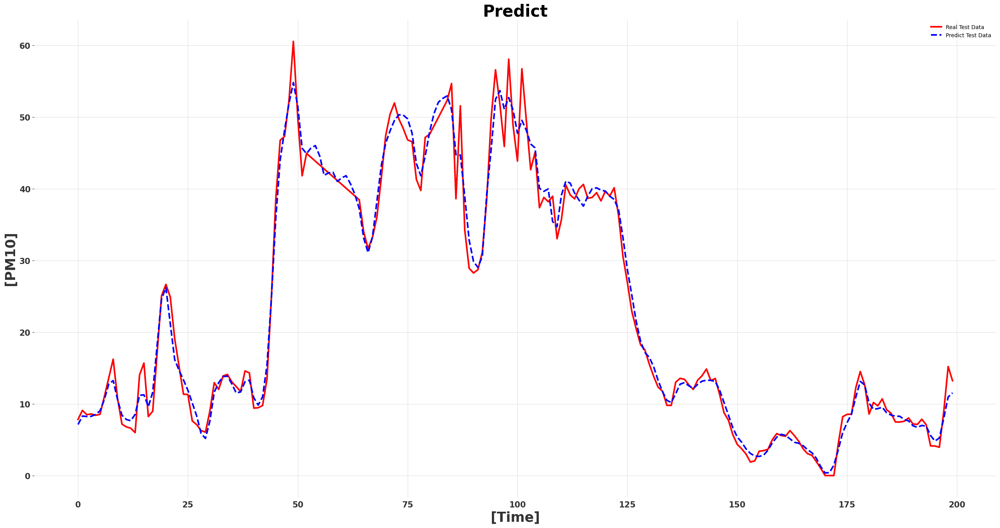

In [18]:
vizualization_self(200,inv_test_y,inv_pred)

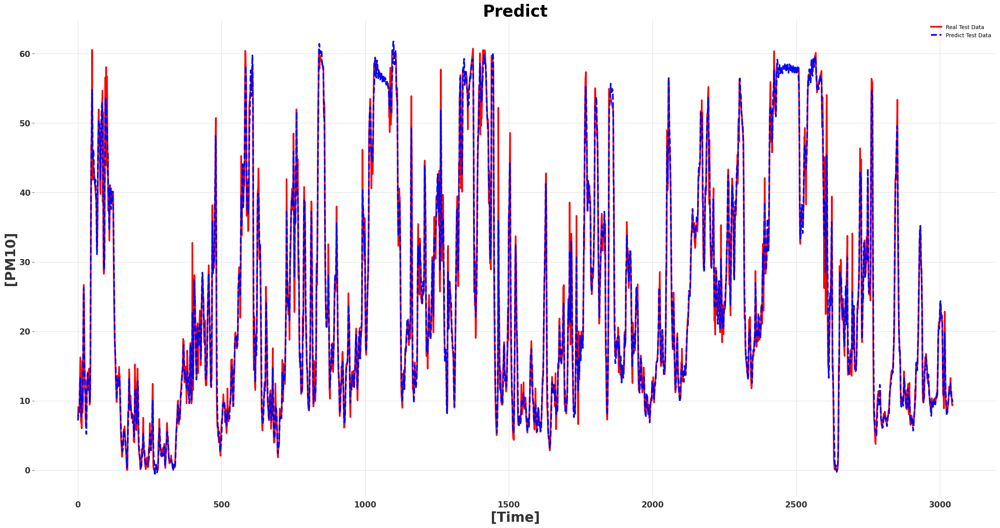

In [19]:
vizualization_self(len(inv_pred),inv_test_y,inv_pred)

In [20]:
def Symmetric_mean_absolute_percentage_error(actual, predicted):
    import numpy as np
    total=len(actual)
    numerator=np.abs(actual-predicted)
    denominator=np.abs(actual)+np.abs(predicted)
    SMAPE=(100/total)*np.sum(numerator/denominator)
    
    return SMAPE

In [21]:
score1=Symmetric_mean_absolute_percentage_error(inv_test_y,inv_pred)
score2=mean_squared_error(inv_test_y,inv_pred)
score3=np.sqrt(score2)
score4=mean_absolute_error(inv_test_y,inv_pred)
    
print("SMAPE score :",100-score1 )
print("MSE score :",score2 )
print("RMSE score :",score3 )
print("MAE score :",score4 )

SMAPE score : 95.87945306336127
MSE score : 2.732710130377135
RMSE score : 1.653091083509053
MAE score : 1.1254252048207811


In [22]:
data = {
                "db_name": '병합',
                "ms_name": '병합',
                "accuracy(SMAPE)": 100 - score1,
                "accuracy(MSE)": score2,
                "accuracy(RMSE)": score3,
                "accuracy(MAE)": score4,
        }

new_data = pd.DataFrame([data])
new_data.to_csv("./Test_Result(SGD,LSTM).csv", header=True, index=False,encoding='utf-8-sig')

## 다른 샘플에서의 성능 확인

In [23]:
scaler1=joblib.load("../Merged_Data/Scaler/in_pm10_min.pkl")
scaler2=joblib.load("../Merged_Data/Scaler/in_pm10_max.pkl")
scaler3=joblib.load("../Merged_Data/Scaler/in_voc_min.pkl")
scaler4=joblib.load("../Merged_Data/Scaler/in_pm10_Seasonal_Trend.pkl")
scaler5=joblib.load("../Merged_Data/Scaler/Y_pm10.pkl")

# 예측 후 결과를 이미지로 저장
def vizualization_save(train_term,test_y,pred_y,name1,name2):
    font_path = "./NanumGothicBold.ttf"
    fontprop = font_manager.FontProperties(fname=font_path)
    
    plt.figure(figsize=(32, 16))
    plt.plot(np.arange(train_term), test_y[0:train_term], color='red', ls='-', lw=3, label='Raw Data')
    plt.plot(np.arange(train_term), pred_y[0:train_term], color='blue', ls='--', lw=3, label='Prediction')
    plt.xlabel('[Time]', fontsize=24, fontweight='bold')
    plt.ylabel('[PM10]', fontsize=24, fontweight='bold')
    plt.title('Predict({:s} {:s})'.format(name1,name2),fontsize=30, weight='bold',fontproperties=fontprop)
    plt.xticks( fontsize=15, fontweight='bold')
    plt.yticks( fontsize=15, fontweight='bold')
    plt.grid(True)
    if not os.path.exists("./pipeline_result(SGD,LSTM)/img/{:s}/".format(name1)):
        os.makedirs("./pipeline_result(SGD,LSTM)/img/{:s}/".format(name1))
        
    plt.savefig("./pipeline_result(SGD,LSTM)/img/{:s}/{:s}.jpg".format(name1,name2))
    return

# 적용할 데이터를 불러온 후 필요한 형식으로 변환
def data_load(address,scaler1,scaler2,scaler3,scaler4,scaler5):
    df1 = pd.read_csv(address).drop("time",axis=1)
    length=int(0.1*len(df1))
    df1=df1[:length]
    
    df1["in_pm10_min"]=scaler1.transform(np.array(df1["in_pm10_min"]).reshape(-1,1))
    df1["in_pm10_max"]=scaler2.transform(np.array(df1["in_pm10_max"]).reshape(-1,1))
    df1["in_voc_min"]=scaler3.transform(np.array(df1["in_voc_min"]).reshape(-1,1))
    df1["in_pm10_Seasonal_Trend"]=scaler4.transform(np.array(df1["in_pm10_Seasonal_Trend"]).reshape(-1,1))
    df1["Y_pm10"]=scaler5.transform(np.array(df1["Y_pm10"]).reshape(-1,1))
    
    df2=df1["Y_pm10"]
    
    time_series_x = df1.drop("Y_pm10",axis=1).values
    time_series_y = df2.values
    
    dataX = []
    dataY = []
    
    for i in range(0, len(time_series_x)-24):
        _x = time_series_x[i:i+24, :]
        _y = time_series_y[i+24-1]
        
        dataX.append(_x)
        dataY.append(_y)
        
    return np.array(dataX), np.array(dataY)

# pipeline에 적용 후 결과(100-SMAPE)를 CSV파일로 저장 
def test_pipeline(data_x,data_y,pipeline,name1,name2):
    pred_y=pipeline.predict(data_x,1)
    inv_data_y=Y_scaler.inverse_transform(np.array(data_y).reshape(-1,1))
    inv_pred_y=Y_scaler.inverse_transform(pred_y[0])
    
    vizualization_save(len(inv_data_y),inv_data_y,inv_pred_y,name1,name2)
    
    score1=Symmetric_mean_absolute_percentage_error(inv_data_y,inv_pred_y)
    score2=mean_squared_error(inv_data_y,inv_pred_y)
    score3=np.sqrt(score2)
    score4=mean_absolute_error(inv_data_y,inv_pred_y)
    
    print("SMAPE score({:s},{:s}) :".format(name1,name2),100-score1 )
    print("MSE score({:s},{:s}) :".format(name1,name2),score2 )
    print("RMSE score({:s},{:s}) :".format(name1,name2),score3 )
    print("MAE score({:s},{:s}) :".format(name1,name2),score4 )
    
    data = {
                "db_name": name1,
                "ms_name": name2,
                "accuracy(SMAPE)": 100 - score1,
                "accuracy(MSE)": score2,
                "accuracy(RMSE)": score3,
                "accuracy(MAE)": score4,
        }
    
    new_data = pd.DataFrame([data])
    new_data.to_csv("./Test_Result(SGD,LSTM).csv",mode='a', header=False, index=False)
        
    return 

In [24]:
csv_list=[]

def get_csv_list(db_name,csv_list):
    list1=os.listdir("../Grouped_Data/{:s}/Seasonal_Trend/".format(db_name))
    
    for file in list1:
        csv_list.append("../Grouped_Data/{:s}/Seasonal_Trend/{:s}".format(db_name,file))

    return csv_list

In [25]:
get_csv_list('air_indoor_도서관',csv_list)
get_csv_list('air_indoor_중학교',csv_list)
get_csv_list('air_indoor_체육시설',csv_list)
get_csv_list('air_indoor_초등학교',csv_list)

['./Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000087.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000088.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000089.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000094.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000095.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000096.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000097.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000098.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000099.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000100.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000101.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000102.csv',
 './Grouped_Data(min,max)/air_indoor_도서관/Seasonal_Trend/ICW0W2000108.csv',
 './Grouped_Data(min,max)

In [26]:
a=csv_list[0]
print(a.split('/')[2].split("_")[-1])
print(a.split('/')[4].split(".")[0])

도서관
ICW0W2000087


SMAPE score(도서관,ICW0W2000087) : 95.4774404237203
MSE score(도서관,ICW0W2000087) : 5.661383461030726
RMSE score(도서관,ICW0W2000087) : 2.3793661889315665
MAE score(도서관,ICW0W2000087) : 1.607057514144953
SMAPE score(도서관,ICW0W2000088) : 94.75654810050935
MSE score(도서관,ICW0W2000088) : 7.533285048159306
RMSE score(도서관,ICW0W2000088) : 2.74468305058331
MAE score(도서관,ICW0W2000088) : 2.0300757793362187
SMAPE score(도서관,ICW0W2000089) : 96.9506925013296
MSE score(도서관,ICW0W2000089) : 2.2615641259410237
RMSE score(도서관,ICW0W2000089) : 1.503849768408076
MAE score(도서관,ICW0W2000089) : 0.9318339302109361
SMAPE score(도서관,ICW0W2000094) : 91.56598552059901
MSE score(도서관,ICW0W2000094) : 5.38274378031979
RMSE score(도서관,ICW0W2000094) : 2.320074089403136
MAE score(도서관,ICW0W2000094) : 1.3819696910761334
SMAPE score(도서관,ICW0W2000095) : 90.25789583406826
MSE score(도서관,ICW0W2000095) : 7.110896119903426
RMSE score(도서관,ICW0W2000095) : 2.66662635551054
MAE score(도서관,ICW0W2000095) : 1.6651524378602958
SMAPE score(도서관,ICW0W200

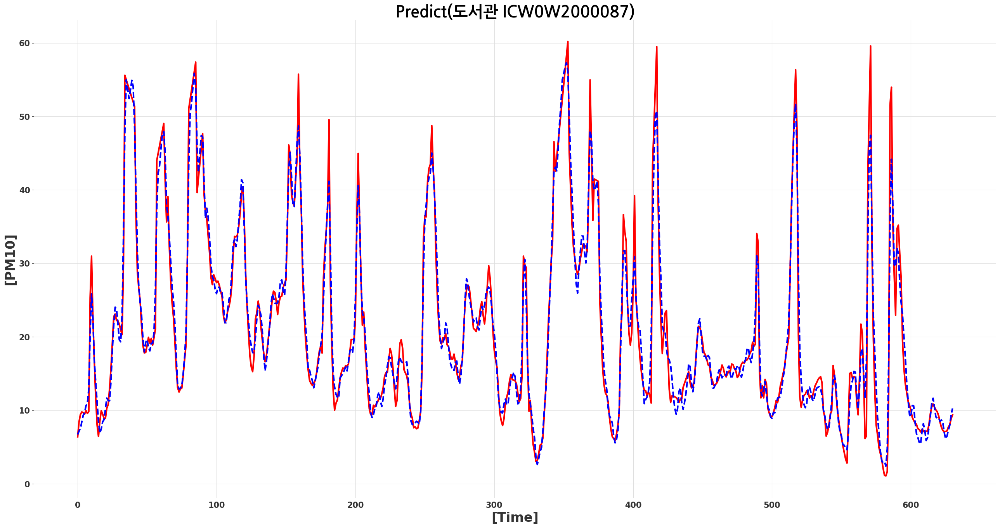

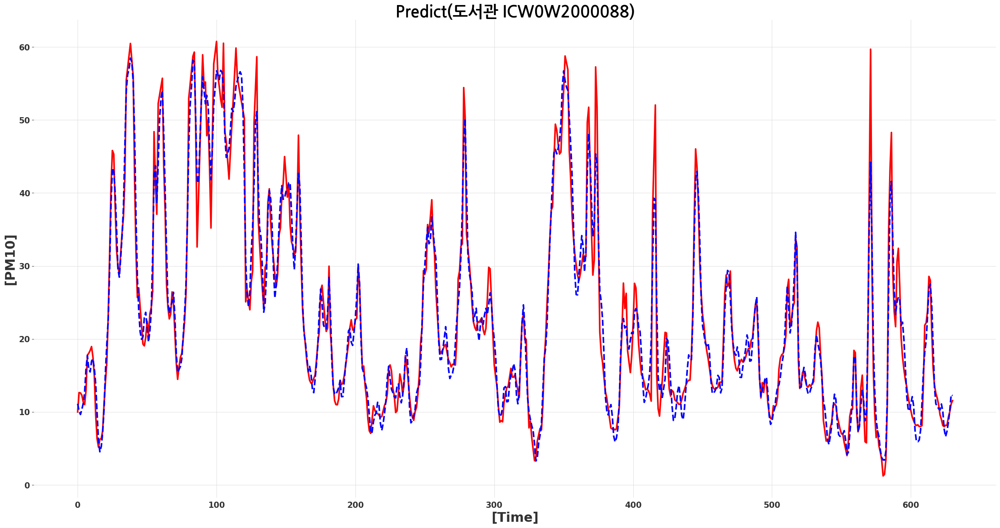

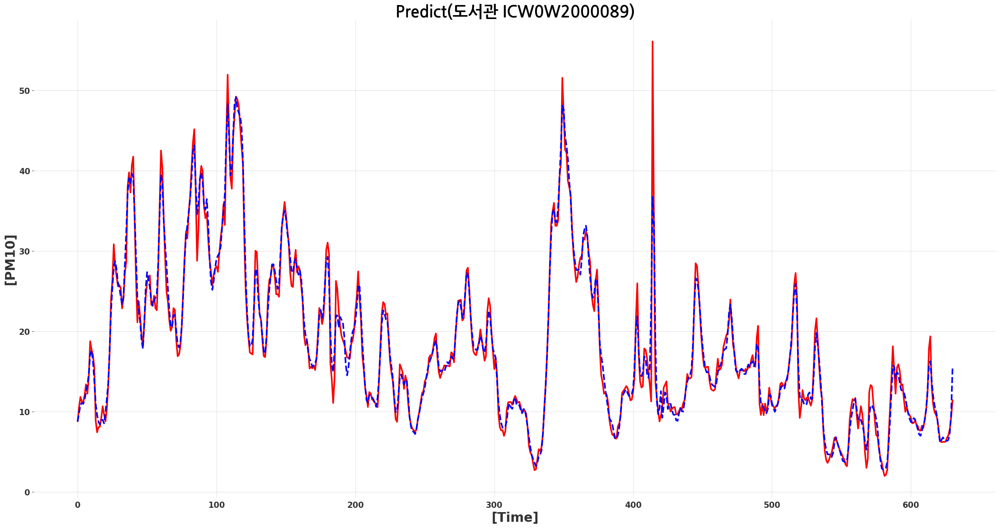

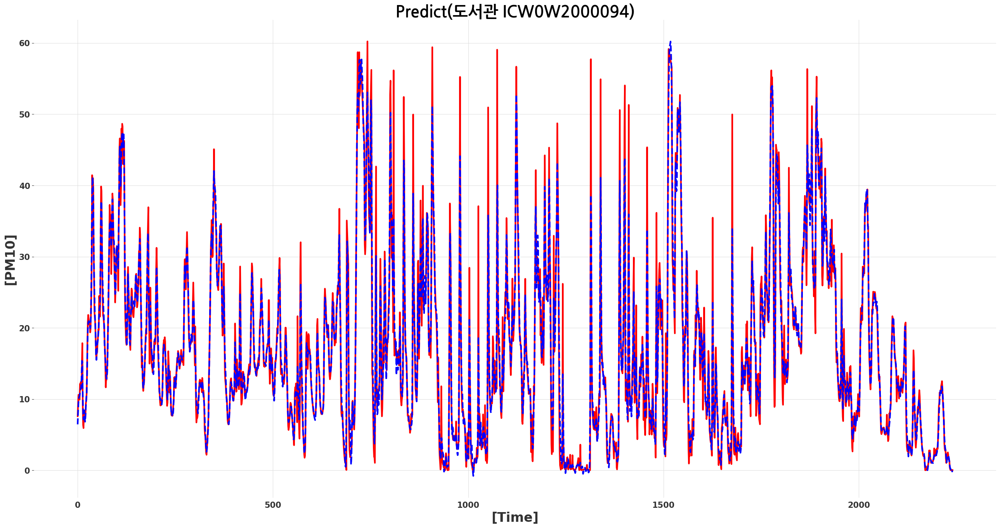

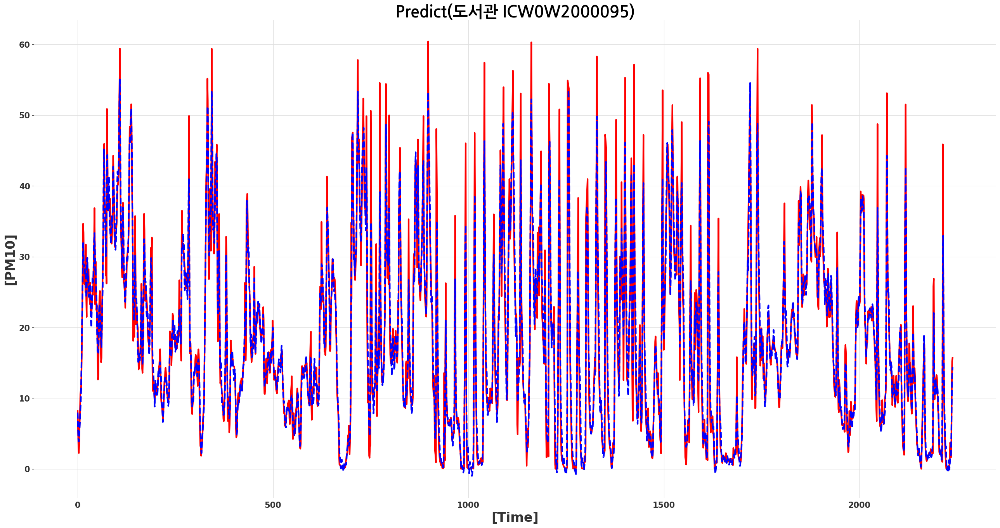

...

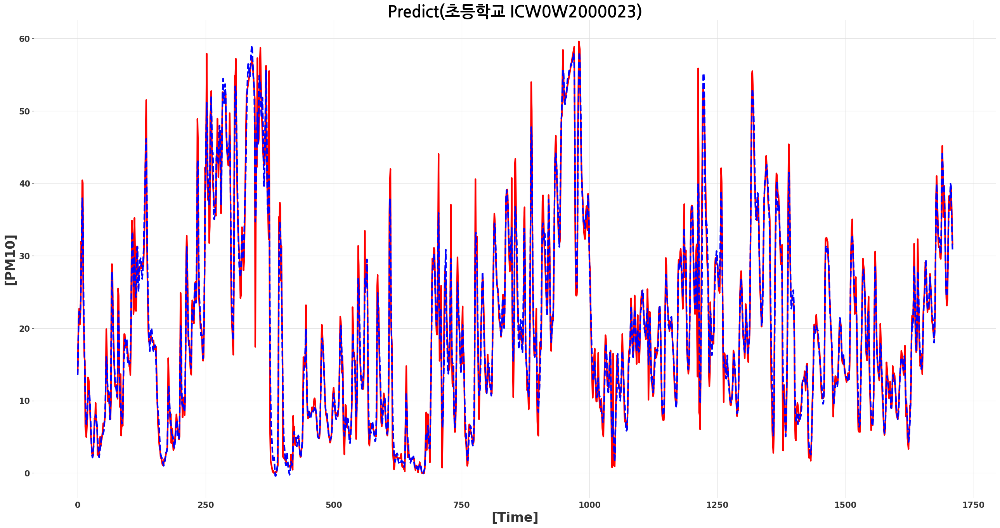

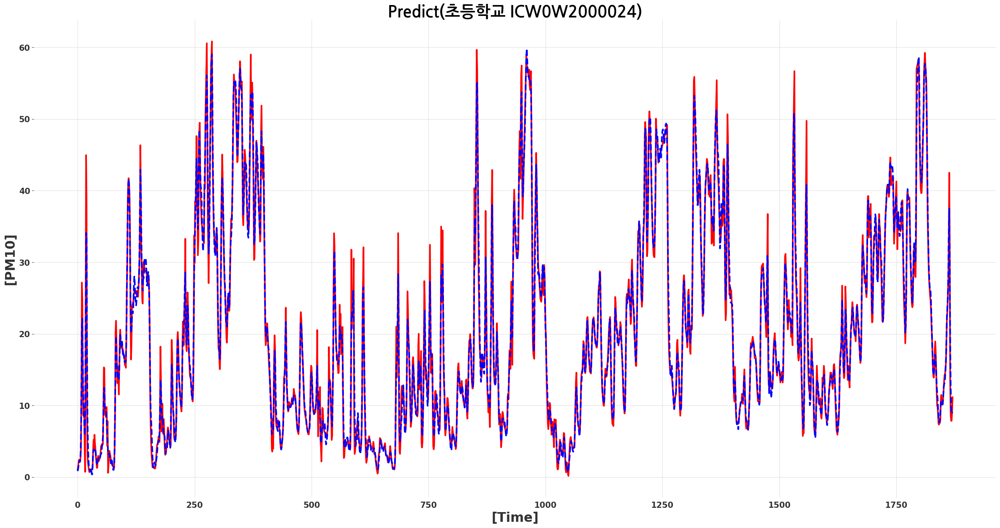

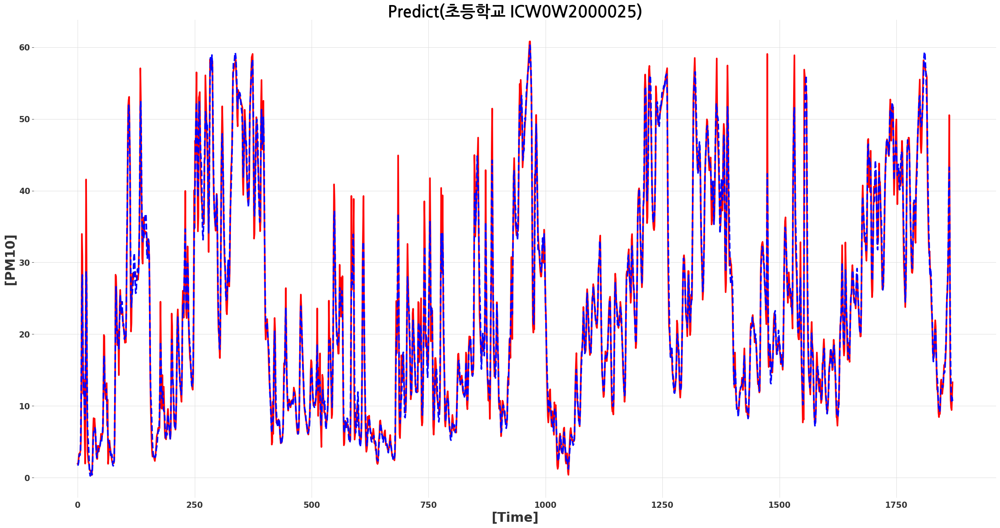

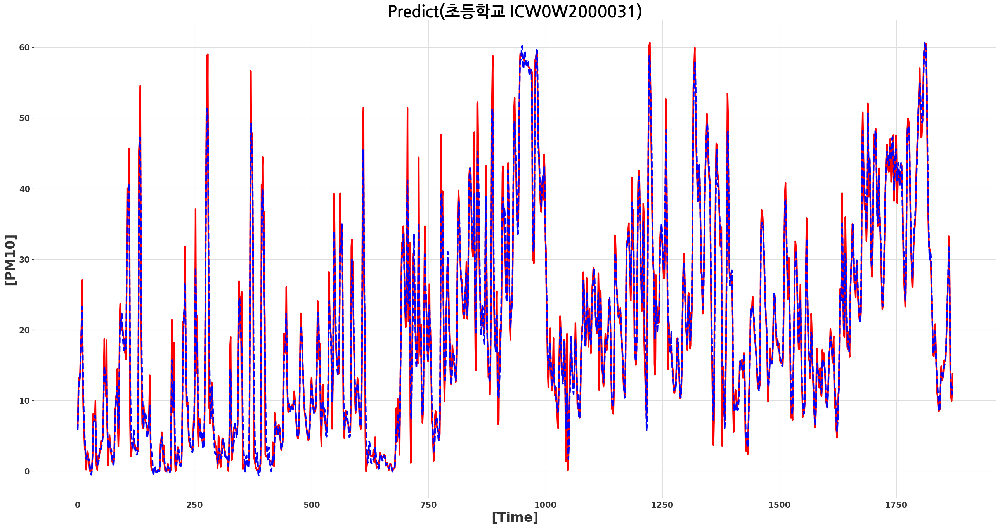

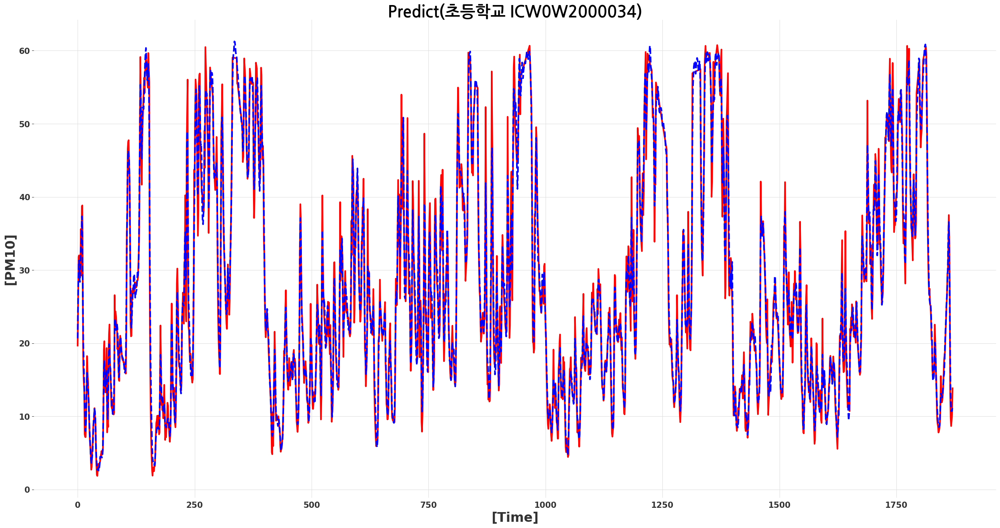

In [27]:
for address in csv_list:
    data_x,data_y=data_load(address,scaler1,scaler2,scaler3,scaler4,scaler5)
    name1=address.split('/')[2].split("_")[-1]
    name2=address.split('/')[4].split(".")[0]
    
    test_pipeline(data_x,data_y,pipeline,name1,name2)